<a href="https://colab.research.google.com/github/Giovanni-Zara/grapevine-berries-anomaly-detection-with-SAM-using-zero-shot-learning/blob/main/Progetto_tesi_Zara.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#WORKFLOW


# Analyze data - Exploratory Data Analysis (EDA)
* Regression of Classification?
* What is the target variable?
* Is the data unbalanced?
* What are the features? Correlation, ranges, variances, values, NaN, errors…
* Plot to make findings clearer
# Define the relevant metrics to be used
# Train a first baseline algorithm as a reference, e.g.:
* For regression, train a model with all the features
* For classification test basic models as the one-class-classifier (always the same class) and the
basic logistic regression with all the features
* If there is already a State of the Art solution, use it as an additional baseline
# Prepare data (where needed):
* cleaning (e.g. remove NaN, outliers, …)
* normalization
* shuffling and train, test and validation set construction
## check the statistical properties of the splits
* Design experiments and define hyperparameters
* Repeat until performance on the test set is acceptable:
* Train model and cross validate hyper parameters until acceptable performance on training set
is achieved
* Test best hyper parameter model and check if there is overfitting or underfitting● Final Evaluation: ablation studies and failure modes

In [1]:
#!jupyter notebook --NotebookApp.allow_origin='https://colab.research.google.com' --port=8888 --NotebookApp.port_retries=0

# Import Segment Anything(SAM) model

---





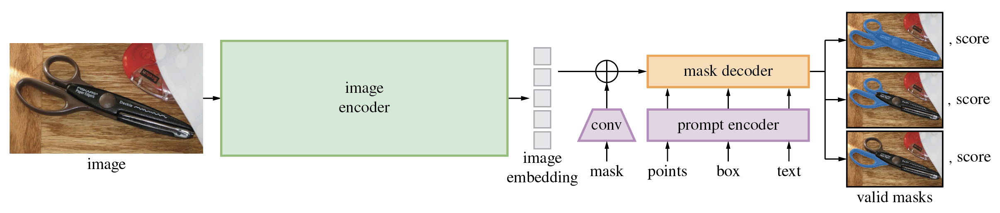

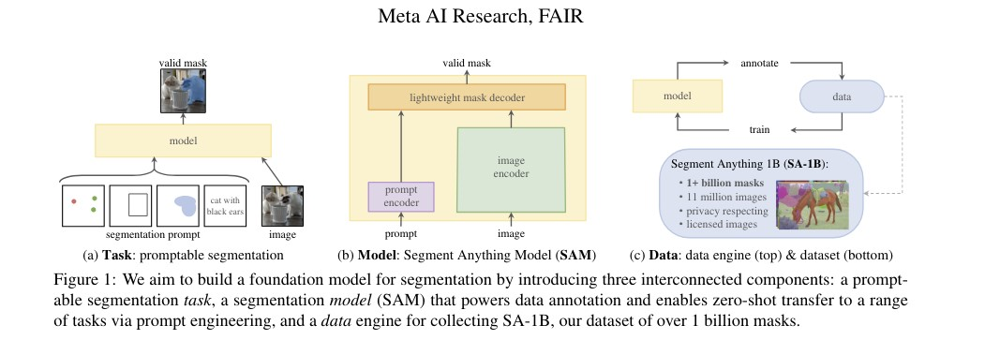

<b>Segment Anything technology</b>, which focuses on identifying and segmenting objects within images, can be very useful in anomaly detection algorithms. Here’s how:

* Accurate Object Localization:

 Segment Anything technology can precisely locate and outline objects in an image. In anomaly detection, having a detailed understanding of where objects are and what they look like when they are normal is crucial for identifying deviations or anomalies.

* Feature Extraction:

 The segmented objects can be used to extract specific features (such as shape, color, texture) that are important for defining what constitutes normality. Anomalies can then be detected by identifying objects whose features significantly deviate from the established normal features.

* Background-Foreground Separation:

 By segmenting objects, the algorithm can separate the relevant foreground objects from the background. Anomalies are often small changes in the foreground that might be missed if the background noise is not properly managed.

* Focused Analysis:

 Instead of analyzing the entire image, the algorithm can focus on the segmented regions of interest. This makes the detection process more efficient and potentially more accurate, as the algorithm does not waste resources on irrelevant parts of the image.


In [2]:
!git clone https://github.com/facebookresearch/segment-anything.git


Cloning into 'segment-anything'...
remote: Enumerating objects: 295, done.
remote: Total 295 (delta 0), reused 0 (delta 0), pack-reused 295
Receiving objects: 100% (295/295), 18.30 MiB | 8.10 MiB/s, done.
Resolving deltas: 100% (155/155), done.


In [3]:
%cd segment-anything/
!pip install -e .

/content/segment-anything
Obtaining file:///content/segment-anything
  Preparing metadata (setup.py) ... done
  Running setup.py develop for segment-anything


In [4]:
!pip install opencv-python pycocotools matplotlib onnxruntime onnx

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 21.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 53.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 11.6 MB/s eta 0:00:00


## importing pythorch vision audio with cuda

In [5]:
using_colab = True
if using_colab:
    import torch
    import torchvision
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())

    #!mkdir images
    #!wget -P images https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/dog.jpg

    #!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

PyTorch version: 2.3.0+cu121
Torchvision version: 0.18.0+cu121
CUDA is available: True


## Loading of the SAM mask autoencoder model
SAM provides three different model types as MAE(mask autoencoder) pre-trained Vision Transformer (ViT):
* vit-b (base dimension)
* vit-l (large dimension)
* vit-h (huge dimension)

The models are the same except for the neural network size, respectively little-large-huge.

I've chosen the vit-l SAM model as encoder, seen that (as reported in the paper) the performances compared with the huge version are just slightly inferior while the model being lighter

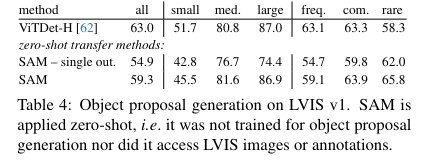

In [6]:
!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_l_0b3195.pth
file_path = '/content/segment-anything/sam_vit_l_0b3195.pth'

--2024-07-01 08:31:16--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_l_0b3195.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 13.226.210.111, 13.226.210.78, 13.226.210.15, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|13.226.210.111|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1249524607 (1.2G) [binary/octet-stream]
Saving to: ‘sam_vit_l_0b3195.pth’

sam_vit_l_0b3195.pt 100%[===================>]   1.16G   142MB/s    in 8.4s    

2024-07-01 08:31:25 (142 MB/s) - ‘sam_vit_l_0b3195.pth’ saved [1249524607/1249524607]



In [7]:
from segment_anything import sam_model_registry
sam = sam_model_registry["vit_l"](checkpoint=file_path)

## setting up the automatic mask generator

In [8]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2

In [9]:
def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)

In [10]:
!ls

assets		    demo       notebooks	     scripts			setup.cfg
CODE_OF_CONDUCT.md  LICENSE    README.md	     segment_anything		setup.py
CONTRIBUTING.md     linter.sh  sam_vit_l_0b3195.pth  segment_anything.egg-info


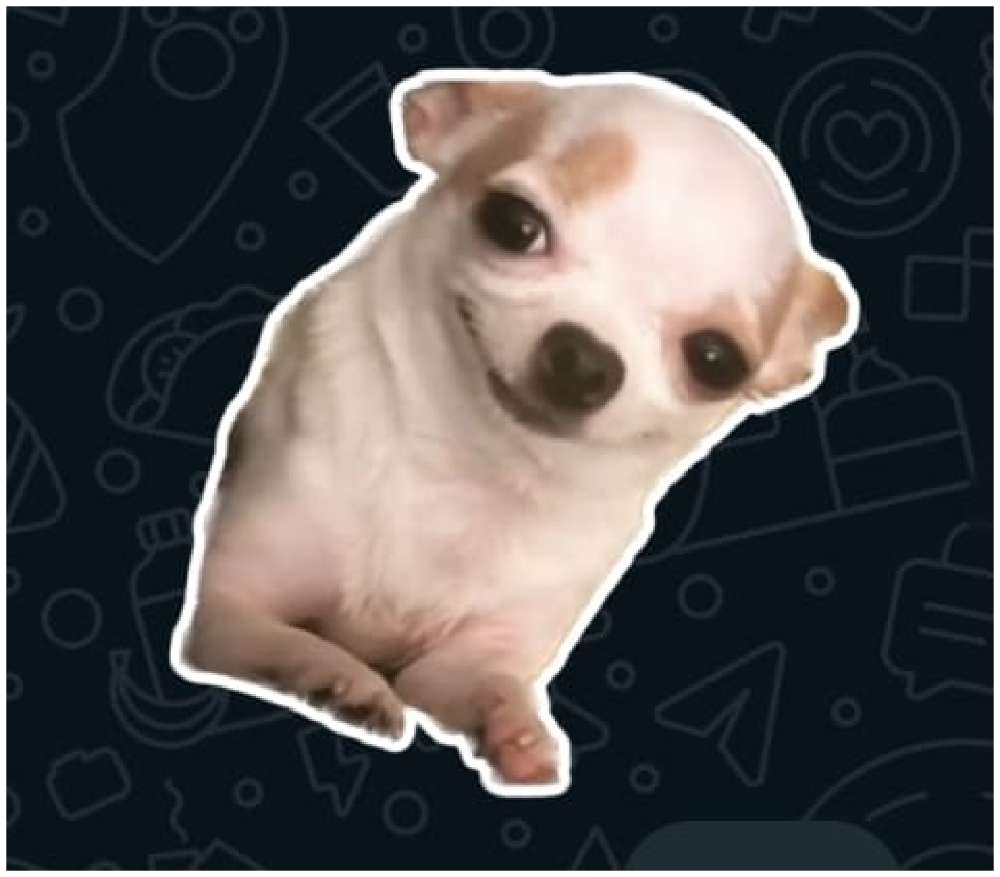

In [11]:
image = cv2.imread('../perrito_tina.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,20))
plt.imshow(image)
plt.axis('off')
plt.show()

In [13]:
import sys
sys.path.append("..")
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

#sam_checkpoint = "sam_vit_h_4b8939.pth"
#model_type = "vit_h"

device = "cuda"

#sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

mask_generator = SamAutomaticMaskGenerator(sam)

In [14]:
masks = mask_generator.generate(image)

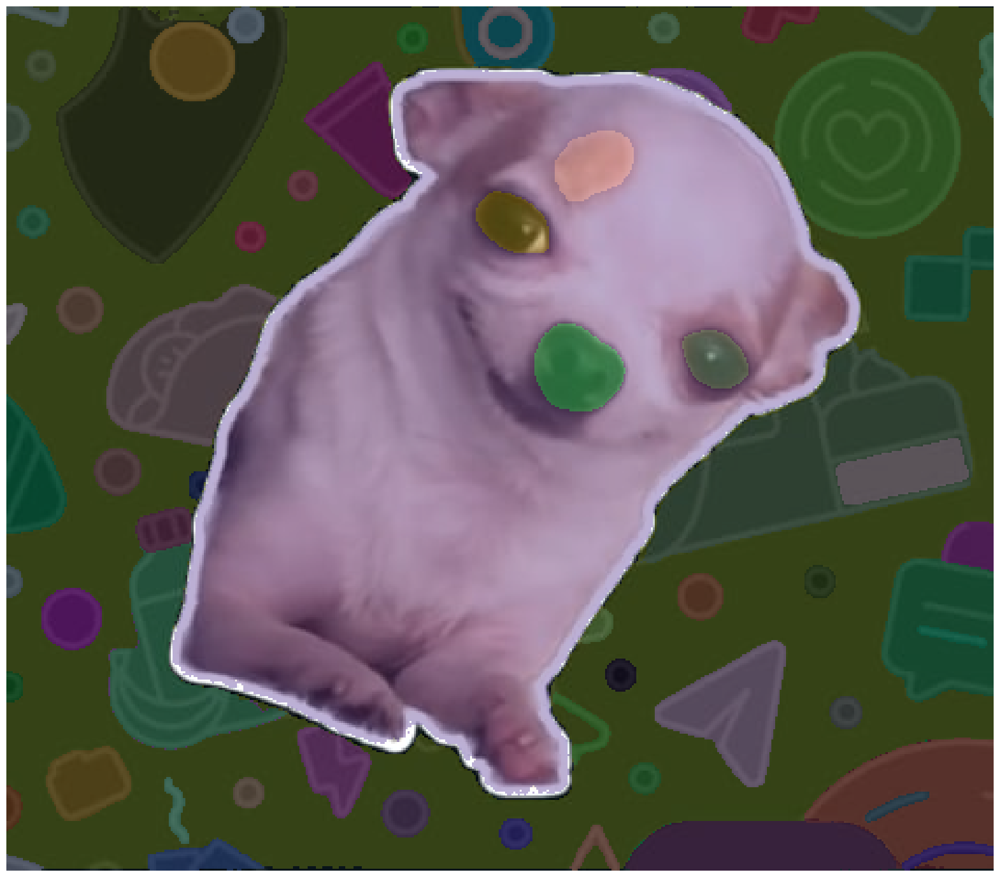

In [15]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks)
plt.axis('off')
plt.show()

In [17]:
!git clone https://github.com/luca-medeiros/lang-segment-anything
%cd lang-segment-anything
#!pip install torch torchvision
!pip install -e .

Cloning into 'lang-segment-anything'...
remote: Enumerating objects: 234, done.
remote: Counting objects: 100% (100/100), done.
remote: Compressing objects: 100% (42/42), done.
remote: Total 234 (delta 74), reused 58 (delta 58), pack-reused 134
Receiving objects: 100% (234/234), 13.23 MiB | 18.11 MiB/s, done.
Resolving deltas: 100% (98/98), done.
/content/segment-anything/lang-segment-anything
Obtaining file:///content/segment-anything/lang-segment-anything
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Cloning https://github.com/IDEA-Research/GroundingDINO.git to /tmp/pip-install-9mlcupqi/groundingdino_23809c78485a4d128d705c3477a318ae
  Running command git clone --filter=blob:none --quiet https://github.com/IDEA-Research/GroundingDINO.git /tmp/pip-install-9mlcupqi/groundingdino_23809c78485a4d128d705c3477a318ae
  Resolved htt

In [22]:
# Install Miniconda
!wget -c https://repo.anaconda.com/miniconda/Miniconda3-latest-Linux-x86_64.sh
!chmod +x Miniconda3-latest-Linux-x86_64.sh
!bash ./Miniconda3-latest-Linux-x86_64.sh -b -f -p /usr/local

# Update conda
!conda install -q -y --prefix /usr/local python=3.8

# Initialize conda
!conda init

# Update the system path
import sys
sys.path.append('/usr/local/lib/python3.8/site-packages')

# Create the environment from environment.yml
!conda env create -f environment.yml

# Activate the new environment
import subprocess
subprocess.run(['source', 'activate', 'lsa'], shell=True)


--2024-07-01 09:19:54--  https://repo.anaconda.com/miniconda/Miniconda3-latest-Linux-x86_64.sh
Resolving repo.anaconda.com (repo.anaconda.com)... 104.16.32.241, 104.16.191.158, 2606:4700::6810:20f1, ...
Connecting to repo.anaconda.com (repo.anaconda.com)|104.16.32.241|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 146836934 (140M) [application/octet-stream]
Saving to: ‘Miniconda3-latest-Linux-x86_64.sh’

Miniconda3-latest-L 100%[===================>] 140.03M   251MB/s    in 0.6s    

2024-07-01 09:19:55 (251 MB/s) - ‘Miniconda3-latest-Linux-x86_64.sh’ saved [146836934/146836934]

PREFIX=/usr/local
Unpacking payload ...

Installing base environment...

Preparing transaction: ...working... done
Executing transaction: ...working... done
installation finished.
    You currently have a PYTHONPATH environment variable set. This may cause
    unexpected behavior when running the Python interpreter in Miniconda3.
    For best results, please verify that your PYTHONPA

CompletedProcess(args=['source', 'activate', 'lsa'], returncode=127)

In [25]:
from PIL import Image
from lang_sam import LangSAM

model = LangSAM()
image_pil = Image.open("/content/IMG_20210924_121801912_0_01.jpg").convert("RGB")
text_prompt = "grape"
masks, boxes, phrases, logits = model.predict(image_pil, text_prompt)

final text_encoder_type: bert-base-uncased


model.safetensors:  83%|########3 | 367M/440M [00:00<?, ?B/s]

groundingdino_swinb_cogcoor.pth:   0%|          | 0.00/938M [00:00<?, ?B/s]

Model loaded from /root/.cache/huggingface/hub/models--ShilongLiu--GroundingDINO/snapshots/a94c9b567a2a374598f05c584e96798a170c56fb/groundingdino_swinb_cogcoor.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])


Downloading: "https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth" to /root/.cache/torch/hub/checkpoints/sam_vit_h_4b8939.pth

  0%|          | 0.00/2.39G [00:00<?, ?B/s]
  0%|          | 1.12M/2.39G [00:00<03:51, 11.1MB/s]
  0%|          | 7.25M/2.39G [00:00<01:01, 41.5MB/s]
  1%|          | 21.2M/2.39G [00:00<00:28, 88.6MB/s]
  1%|▏         | 33.4M/2.39G [00:00<00:24, 104MB/s] 
  2%|▏         | 46.5M/2.39G [00:00<00:21, 116MB/s]
  3%|▎         | 64.0M/2.39G [00:00<00:18, 138MB/s]
  3%|▎         | 82.4M/2.39G [00:00<00:15, 155MB/s]
  4%|▍         | 102M/2.39G [00:00<00:14, 172MB/s] 
  5%|▍         | 121M/2.39G [00:00<00:13, 179MB/s]
  6%|▌         | 138M/2.39G [00:01<00:13, 177MB/s]
  6%|▋         | 158M/2.39G [00:01<00:13, 184MB/s]
  7%|▋         | 175M/2.39G [00:01<00:13, 181MB/s]
  8%|▊         | 192M/2.39G [00:01<00:13, 179MB/s]
  9%|▊         | 210M/2.39G [00:01<00:14, 164MB/s]
  9%|▉         | 230M/2.39G [00:01<00:12, 179MB/s]
 10%|█         | 250M/2.39G [00:01<

In [27]:
def print_bounding_boxes(boxes):
    print("Bounding Boxes:")
    for i, box in enumerate(boxes):
        print(f"Box {i+1}: {box}")

def print_detected_phrases(phrases):
    print("\nDetected Phrases:")
    for i, phrase in enumerate(phrases):
        print(f"Phrase {i+1}: {phrase}")

def print_logits(logits):
    print("\nConfidence:")
    for i, logit in enumerate(logits):
        print(f"Logit {i+1}: {logit}")

In [28]:
  print_bounding_boxes(boxes)
  print_detected_phrases(phrases)
  print_logits(logits)

Bounding Boxes:
Box 1: tensor([1.8454e-02, 4.5705e-02, 6.0002e+02, 6.0004e+02])

Detected Phrases:
Phrase 1: grape

Confidence:
Logit 1: 0.646358072757721


In [29]:
def display_image_with_masks(image, masks):
    num_masks = len(masks)

    fig, axes = plt.subplots(1, num_masks + 1, figsize=(15, 5))
    axes[0].imshow(image)
    axes[0].set_title("Original Image")
    axes[0].axis('off')

    for i, mask_np in enumerate(masks):
        axes[i+1].imshow(mask_np, cmap='gray')
        axes[i+1].set_title(f"Mask {i+1}")
        axes[i+1].axis('off')

    plt.tight_layout()
    plt.show()

def display_image_with_boxes(image, boxes, logits):
    fig, ax = plt.subplots()
    ax.imshow(image)
    ax.set_title("Image with Bounding Boxes")
    ax.axis('off')

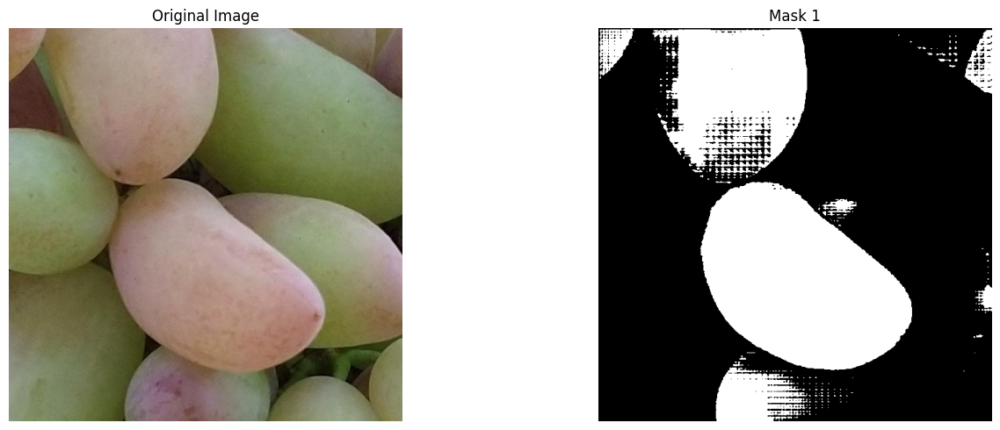

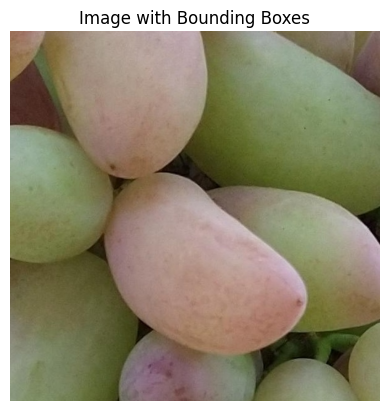

In [32]:
masks_np = [mask.squeeze().cpu().numpy() for mask in masks]
display_image_with_masks(image_pil, masks_np)

            # Display the image with bounding boxes and confidence scores
display_image_with_boxes(image_pil, boxes, logits)

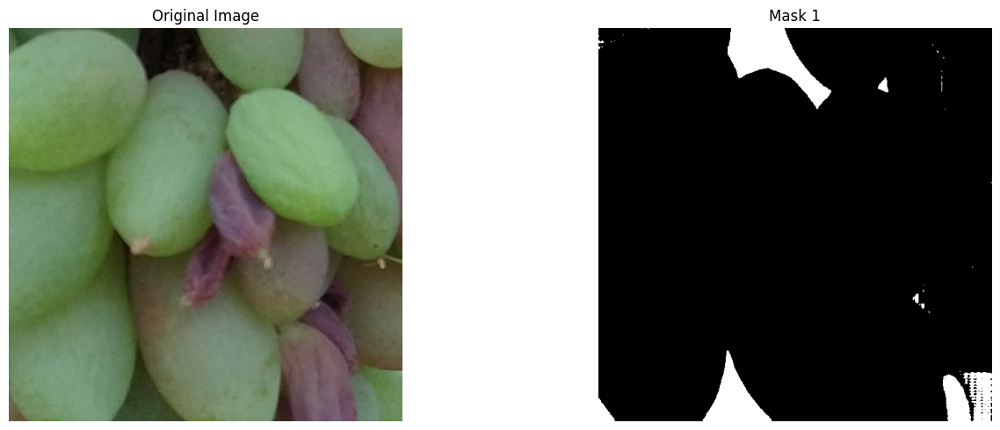

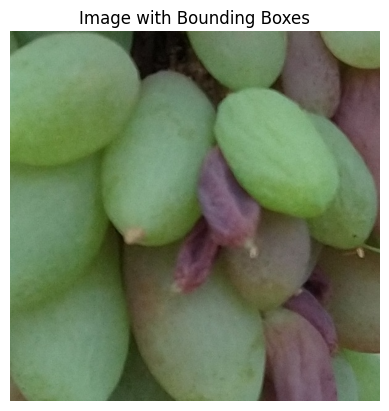

In [38]:
image_pil = Image.open("/content/IMG_20210924_155857590_00.jpg").convert("RGB")
text_prompt = "grape"
masks, boxes, phrases, logits = model.predict(image_pil, text_prompt)
masks_np = [mask.squeeze().cpu().numpy() for mask in masks]
display_image_with_masks(image_pil, masks_np)

            # Display the image with bounding boxes and confidence scores
display_image_with_boxes(image_pil, boxes, logits)

In [ ]:
def download_image(url):
    response = requests.get(url)
    response.raise_for_status()
    return Image.open(BytesIO(response.content)).convert("RGB")

def save_mask(mask_np, filename):
    mask_image = Image.fromarray((mask_np * 255).astype(np.uint8))
    mask_image.save(filename)

def display_image_with_masks(image, masks):
    num_masks = len(masks)

    fig, axes = plt.subplots(1, num_masks + 1, figsize=(15, 5))
    axes[0].imshow(image)
    axes[0].set_title("Original Image")
    axes[0].axis('off')

    for i, mask_np in enumerate(masks):
        axes[i+1].imshow(mask_np, cmap='gray')
        axes[i+1].set_title(f"Mask {i+1}")
        axes[i+1].axis('off')

    plt.tight_layout()
    plt.show()

def display_image_with_boxes(image, boxes, logits):
    fig, ax = plt.subplots()
    ax.imshow(image)
    ax.set_title("Image with Bounding Boxes")
    ax.axis('off')

    for box, logit in zip(boxes, logits):
        x_min, y_min, x_max, y_max = box
        confidence_score = round(logit.item(), 2)  # Convert logit to a scalar before rounding
        box_width = x_max - x_min
        box_height = y_max - y_min

        # Draw bounding box
        rect = plt.Rectangle((x_min, y_min), box_width, box_height, fill=False, edgecolor='red', linewidth=2)
        ax.add_patch(rect)

        # Add confidence score as text
        ax.text(x_min, y_min, f"Confidence: {confidence_score}", fontsize=8, color='red', verticalalignment='top')

    plt.show()

def print_bounding_boxes(boxes):
    print("Bounding Boxes:")
    for i, box in enumerate(boxes):
        print(f"Box {i+1}: {box}")

def print_detected_phrases(phrases):
    print("\nDetected Phrases:")
    for i, phrase in enumerate(phrases):
        print(f"Phrase {i+1}: {phrase}")

def print_logits(logits):
    print("\nConfidence:")
    for i, logit in enumerate(logits):
        print(f"Logit {i+1}: {logit}")


final text_encoder_type: bert-base-uncased
Model loaded from /root/.cache/huggingface/hub/models--ShilongLiu--GroundingDINO/snapshots/a94c9b567a2a374598f05c584e96798a170c56fb/groundingdino_swinb_cogcoor.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])


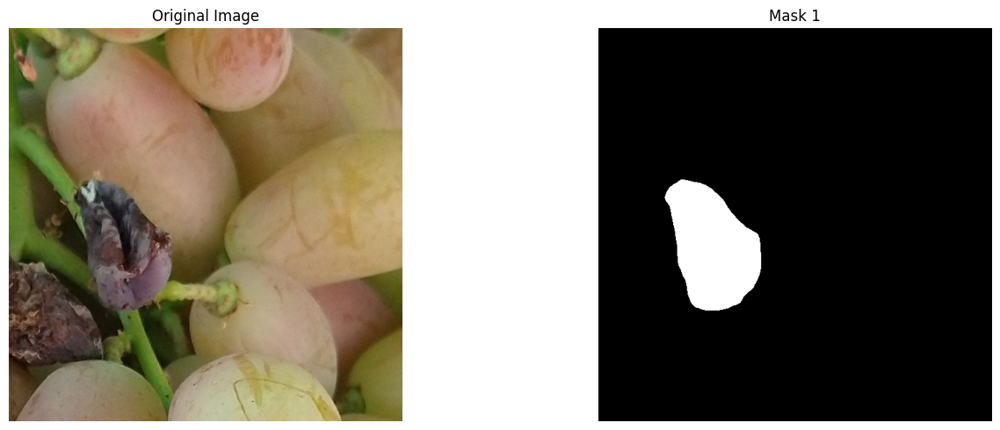

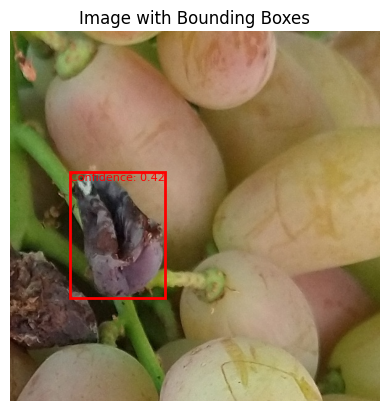

Bounding Boxes:
Box 1: tensor([ 96.7840, 227.9269, 251.3584, 433.0037])

Detected Phrases:
Phrase 1: grape

Confidence:
Logit 1: 0.41699036955833435


In [50]:
import warnings
import numpy as np
import matplotlib.pyplot as plt
import requests
from PIL import Image
from io import BytesIO
from lang_sam import LangSAM

image = "/content/IMG_20210924_132434569_00.jpg"
# image = "./image.jpg"
text_prompt = "grape with diseases"



    # Suppress warning messages
warnings.filterwarnings("ignore")

try:
    if image.startswith("http"):
        image_pil = download_image(image)
    else:
        image_pil = Image.open(image).convert("RGB")

    model = LangSAM()
    masks, boxes, phrases, logits = model.predict(image_pil, text_prompt)

    if len(masks) == 0:
        print(f"No objects of the '{text_prompt}' prompt detected in the image.")
    else:
        # Convert masks to numpy arrays
        masks_np = [mask.squeeze().cpu().numpy() for mask in masks]

        # Display the original image and masks side by side
        display_image_with_masks(image_pil, masks_np)

        # Display the image with bounding boxes and confidence scores
        display_image_with_boxes(image_pil, boxes, logits)

        # Save the masks
        for i, mask_np in enumerate(masks_np):
            mask_path = f"image_mask_{i+1}.png"
            save_mask(mask_np, mask_path)

        # Print the bounding boxes, phrases, and logits
        print_bounding_boxes(boxes)
        print_detected_phrases(phrases)
        print_logits(logits)

except (requests.exceptions.RequestException, IOError) as e:
    print(f"Error: {e}")



final text_encoder_type: bert-base-uncased
Model loaded from /root/.cache/huggingface/hub/models--ShilongLiu--GroundingDINO/snapshots/a94c9b567a2a374598f05c584e96798a170c56fb/groundingdino_swinb_cogcoor.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])


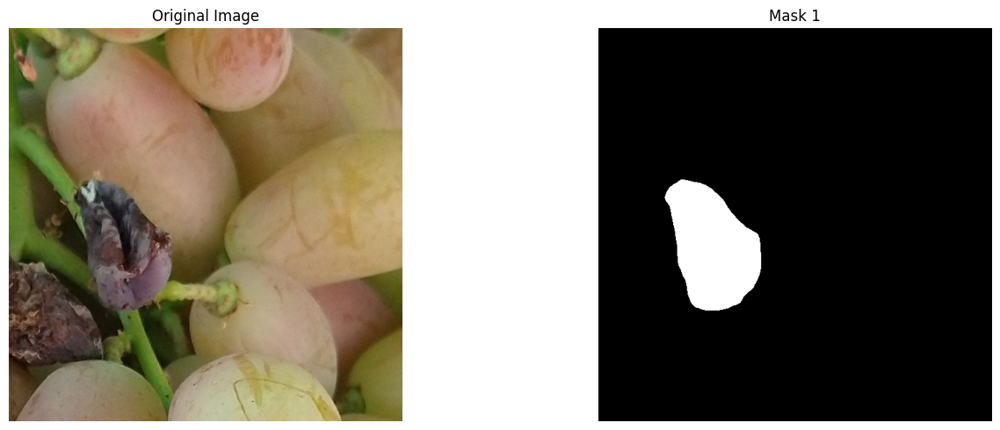

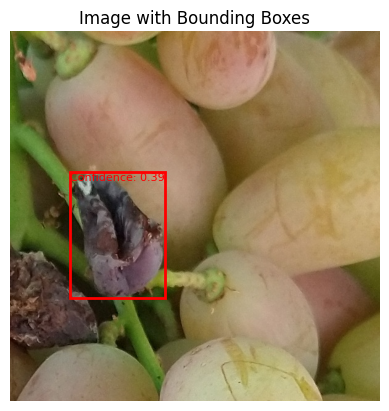

Bounding Boxes:
Box 1: tensor([ 97.1842, 228.2962, 250.8672, 433.0204])

Detected Phrases:
Phrase 1: grape

Confidence:
Logit 1: 0.39076846837997437


In [51]:
import warnings
import numpy as np
import matplotlib.pyplot as plt
import requests
from PIL import Image
from io import BytesIO
from lang_sam import LangSAM

image = "/content/IMG_20210924_132434569_00.jpg"
# image = "./image.jpg"
text_prompt = "grape with sickness"



    # Suppress warning messages
warnings.filterwarnings("ignore")

try:
    if image.startswith("http"):
        image_pil = download_image(image)
    else:
        image_pil = Image.open(image).convert("RGB")

    model = LangSAM()
    masks, boxes, phrases, logits = model.predict(image_pil, text_prompt)

    if len(masks) == 0:
        print(f"No objects of the '{text_prompt}' prompt detected in the image.")
    else:
        # Convert masks to numpy arrays
        masks_np = [mask.squeeze().cpu().numpy() for mask in masks]

        # Display the original image and masks side by side
        display_image_with_masks(image_pil, masks_np)

        # Display the image with bounding boxes and confidence scores
        display_image_with_boxes(image_pil, boxes, logits)

        # Save the masks
        for i, mask_np in enumerate(masks_np):
            mask_path = f"image_mask_{i+1}.png"
            save_mask(mask_np, mask_path)

        # Print the bounding boxes, phrases, and logits
        print_bounding_boxes(boxes)
        print_detected_phrases(phrases)
        print_logits(logits)

except (requests.exceptions.RequestException, IOError) as e:
    print(f"Error: {e}")



final text_encoder_type: bert-base-uncased
Model loaded from /root/.cache/huggingface/hub/models--ShilongLiu--GroundingDINO/snapshots/a94c9b567a2a374598f05c584e96798a170c56fb/groundingdino_swinb_cogcoor.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])


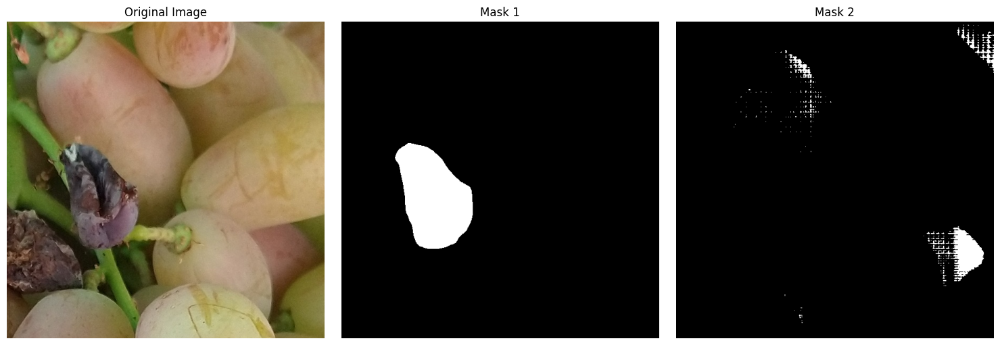

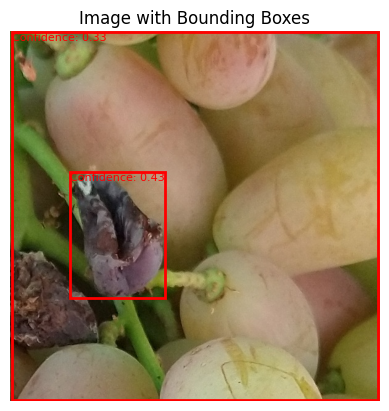

Bounding Boxes:
Box 1: tensor([ 97.0834, 228.1779, 250.9197, 432.9515])
Box 2: tensor([  2.7946,   1.0486, 597.5650, 597.4312])

Detected Phrases:
Phrase 1: rotten grape
Phrase 2: rotten grape

Confidence:
Logit 1: 0.432823121547699
Logit 2: 0.3279065489768982


In [52]:
import warnings
import numpy as np
import matplotlib.pyplot as plt
import requests
from PIL import Image
from io import BytesIO
from lang_sam import LangSAM

image = "/content/IMG_20210924_132434569_00.jpg"
# image = "./image.jpg"
text_prompt = "rotten grape"



    # Suppress warning messages
warnings.filterwarnings("ignore")

try:
    if image.startswith("http"):
        image_pil = download_image(image)
    else:
        image_pil = Image.open(image).convert("RGB")

    model = LangSAM()
    masks, boxes, phrases, logits = model.predict(image_pil, text_prompt)

    if len(masks) == 0:
        print(f"No objects of the '{text_prompt}' prompt detected in the image.")
    else:
        # Convert masks to numpy arrays
        masks_np = [mask.squeeze().cpu().numpy() for mask in masks]

        # Display the original image and masks side by side
        display_image_with_masks(image_pil, masks_np)

        # Display the image with bounding boxes and confidence scores
        display_image_with_boxes(image_pil, boxes, logits)

        # Save the masks
        for i, mask_np in enumerate(masks_np):
            mask_path = f"image_mask_{i+1}.png"
            save_mask(mask_np, mask_path)

        # Print the bounding boxes, phrases, and logits
        print_bounding_boxes(boxes)
        print_detected_phrases(phrases)
        print_logits(logits)

except (requests.exceptions.RequestException, IOError) as e:
    print(f"Error: {e}")



final text_encoder_type: bert-base-uncased
Model loaded from /root/.cache/huggingface/hub/models--ShilongLiu--GroundingDINO/snapshots/a94c9b567a2a374598f05c584e96798a170c56fb/groundingdino_swinb_cogcoor.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])


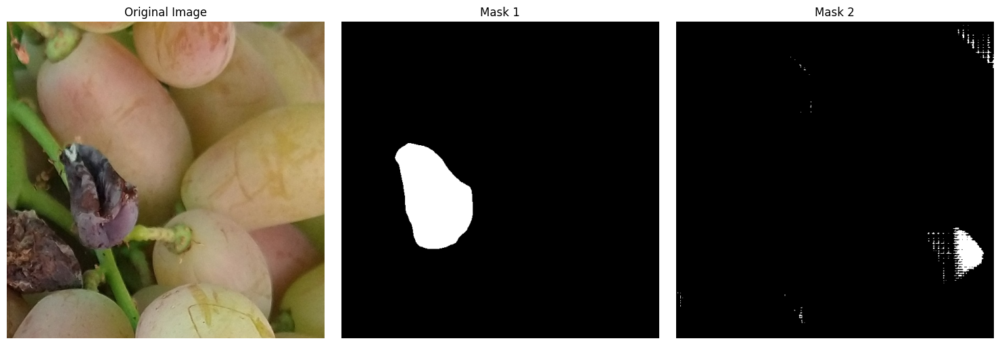

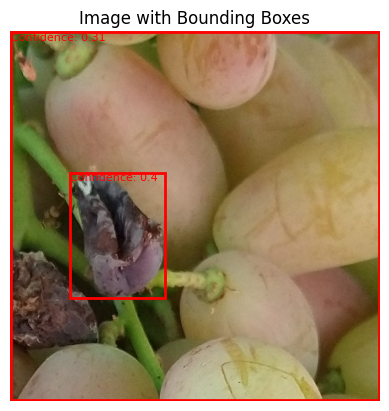

Bounding Boxes:
Box 1: tensor([ 97.0796, 228.6208, 250.6938, 432.9341])
Box 2: tensor([1.1875e+00, 5.6670e-01, 5.9895e+02, 5.9828e+02])

Detected Phrases:
Phrase 1: rotten
Phrase 2: rotten

Confidence:
Logit 1: 0.3990470767021179
Logit 2: 0.312223345041275
final text_encoder_type: bert-base-uncased
Model loaded from /root/.cache/huggingface/hub/models--ShilongLiu--GroundingDINO/snapshots/a94c9b567a2a374598f05c584e96798a170c56fb/groundingdino_swinb_cogcoor.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])


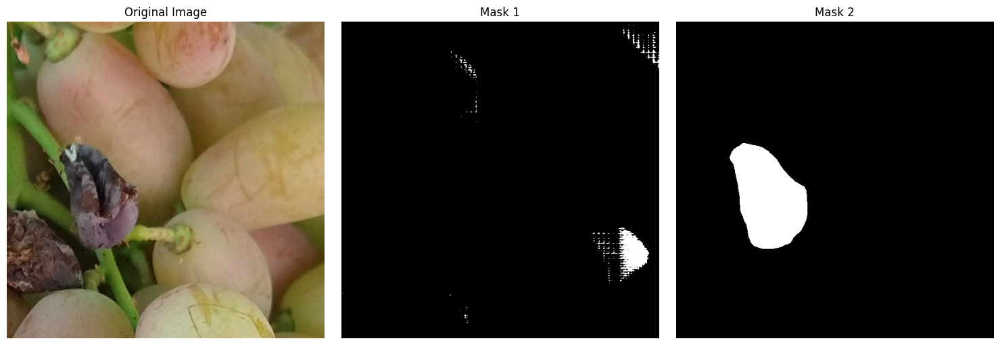

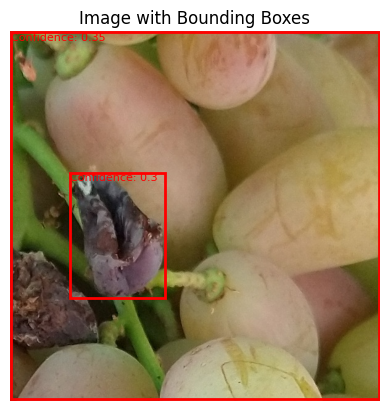

Bounding Boxes:
Box 1: tensor([  1.8465,   1.2265, 598.6883, 596.9982])
Box 2: tensor([ 97.5104, 228.5740, 250.5356, 433.0933])

Detected Phrases:
Phrase 1: sick
Phrase 2: sick

Confidence:
Logit 1: 0.3509444296360016
Logit 2: 0.30149537324905396
final text_encoder_type: bert-base-uncased
Model loaded from /root/.cache/huggingface/hub/models--ShilongLiu--GroundingDINO/snapshots/a94c9b567a2a374598f05c584e96798a170c56fb/groundingdino_swinb_cogcoor.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])


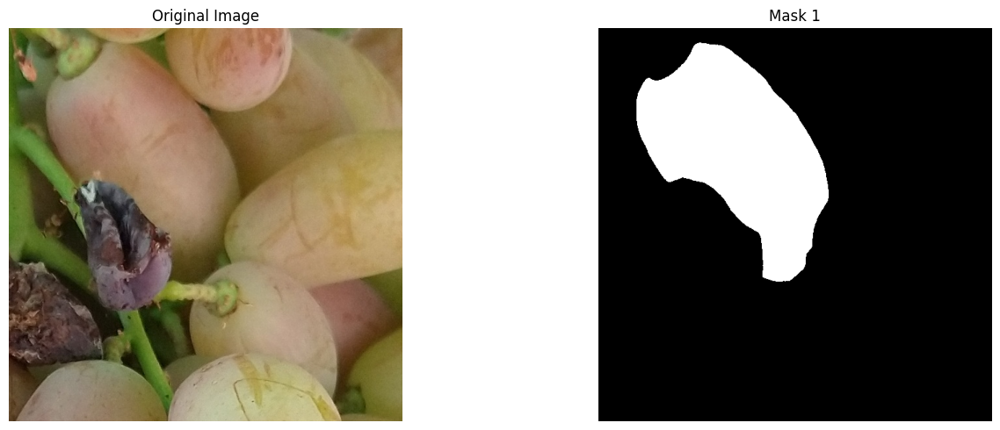

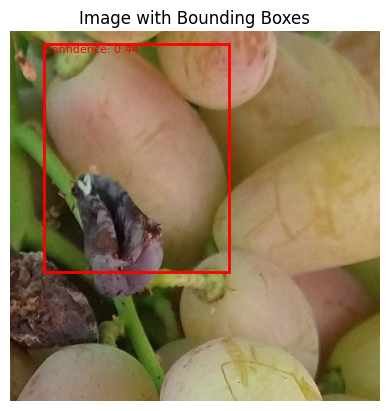

Bounding Boxes:
Box 1: tensor([ 55.0112,  20.1728, 354.7723, 390.3453])

Detected Phrases:
Phrase 1: moldy

Confidence:
Logit 1: 0.44300976395606995
final text_encoder_type: bert-base-uncased
Model loaded from /root/.cache/huggingface/hub/models--ShilongLiu--GroundingDINO/snapshots/a94c9b567a2a374598f05c584e96798a170c56fb/groundingdino_swinb_cogcoor.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])


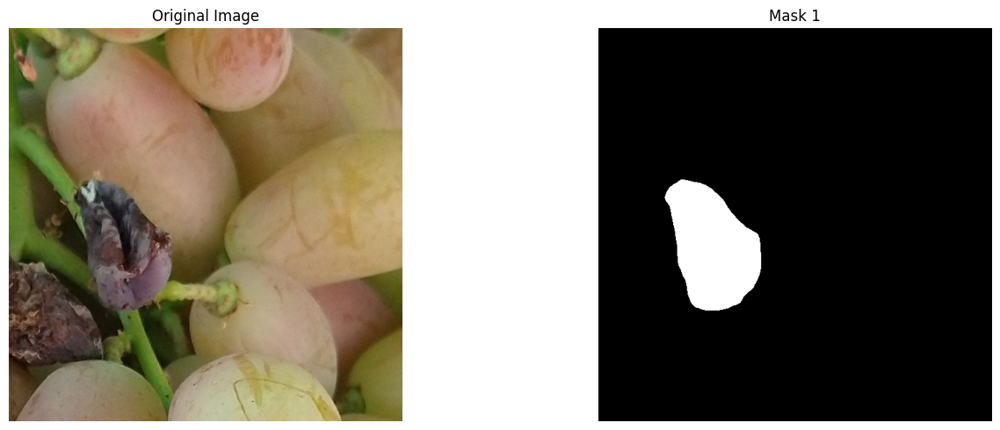

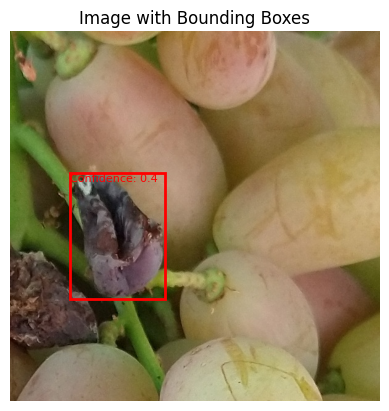

Bounding Boxes:
Box 1: tensor([ 97.2663, 228.7008, 250.9856, 433.3484])

Detected Phrases:
Phrase 1: rancid

Confidence:
Logit 1: 0.400939017534256
final text_encoder_type: bert-base-uncased
Model loaded from /root/.cache/huggingface/hub/models--ShilongLiu--GroundingDINO/snapshots/a94c9b567a2a374598f05c584e96798a170c56fb/groundingdino_swinb_cogcoor.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])


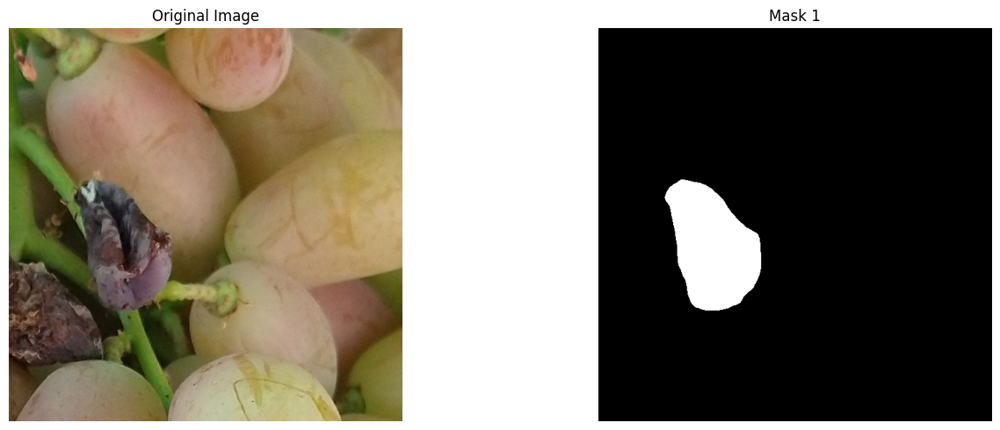

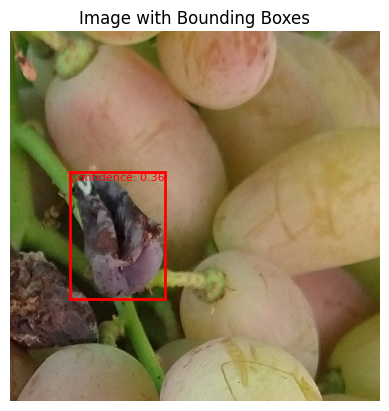

Bounding Boxes:
Box 1: tensor([ 96.7103, 228.1103, 251.1571, 433.4489])

Detected Phrases:
Phrase 1: putrid

Confidence:
Logit 1: 0.3605739176273346
final text_encoder_type: bert-base-uncased
Model loaded from /root/.cache/huggingface/hub/models--ShilongLiu--GroundingDINO/snapshots/a94c9b567a2a374598f05c584e96798a170c56fb/groundingdino_swinb_cogcoor.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])


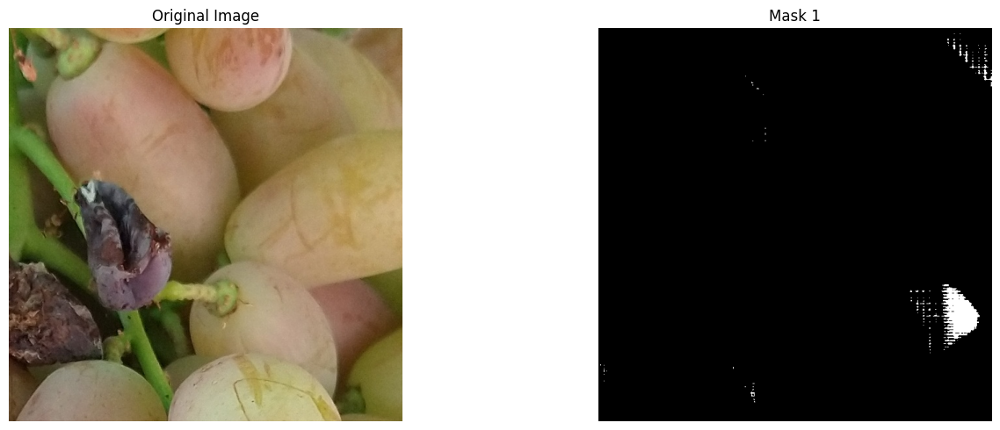

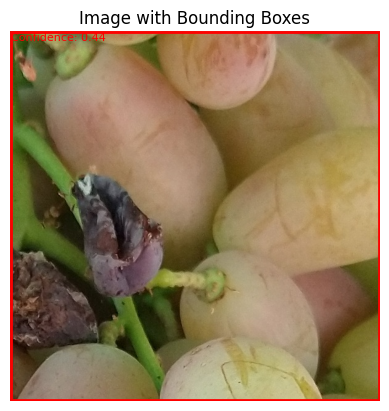

Bounding Boxes:
Box 1: tensor([  0.9655,   0.8330, 599.0900, 597.6787])

Detected Phrases:
Phrase 1: disgusting

Confidence:
Logit 1: 0.44326892495155334


In [63]:
import warnings
import numpy as np
import matplotlib.pyplot as plt
import requests
from PIL import Image
from io import BytesIO
from lang_sam import LangSAM

image = "/content/IMG_20210924_132434569_00.jpg"
# image = "./image.jpg"
prompts=["rotten", "sick","moldy","rancid","putrid","bad","decomposed"]

for i in range(len(prompts)):
  text_prompt = prompts[i]

      # Suppress warning messages
  warnings.filterwarnings("ignore")

  try:
      if image.startswith("http"):
          image_pil = download_image(image)
      else:
          image_pil = Image.open(image).convert("RGB")

      model = LangSAM()
      masks, boxes, phrases, logits = model.predict(image_pil, text_prompt)

      if len(masks) == 0:
          print(f"No objects of the '{text_prompt}' prompt detected in the image.")
      else:
          # Convert masks to numpy arrays
          masks_np = [mask.squeeze().cpu().numpy() for mask in masks]

          # Display the original image and masks side by side
          display_image_with_masks(image_pil, masks_np)

          # Display the image with bounding boxes and confidence scores
          display_image_with_boxes(image_pil, boxes, logits)

          # Save the masks
          for i, mask_np in enumerate(masks_np):
              mask_path = f"image_mask_{i+1}.png"
              save_mask(mask_np, mask_path)

          # Print the bounding boxes, phrases, and logits
          print_bounding_boxes(boxes)
          print_detected_phrases(phrases)
          print_logits(logits)
          print("------------------------------------------------------------\n")
  except (requests.exceptions.RequestException, IOError) as e:
      print(f"Error: {e}")



final text_encoder_type: bert-base-uncased
Model loaded from /root/.cache/huggingface/hub/models--ShilongLiu--GroundingDINO/snapshots/a94c9b567a2a374598f05c584e96798a170c56fb/groundingdino_swinb_cogcoor.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])


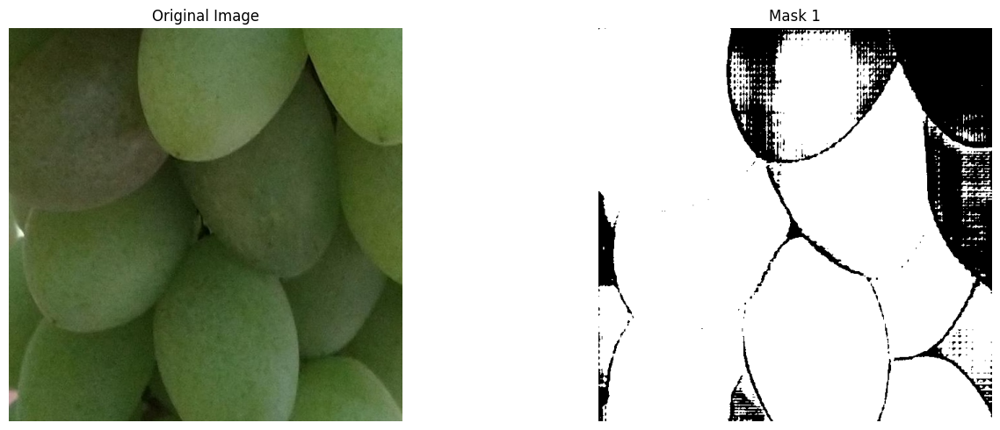

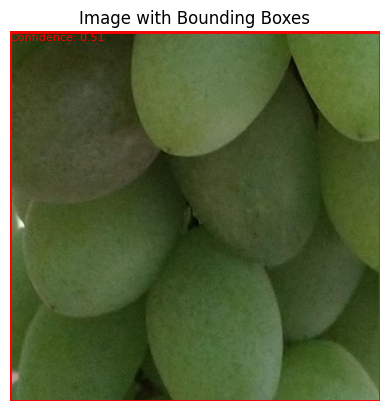

Bounding Boxes:
Box 1: tensor([1.8382e-02, 5.7220e-04, 6.0002e+02, 6.0000e+02])

Detected Phrases:
Phrase 1: rotten

Confidence:
Logit 1: 0.512016773223877
------------------------------------------------------------

final text_encoder_type: bert-base-uncased
Model loaded from /root/.cache/huggingface/hub/models--ShilongLiu--GroundingDINO/snapshots/a94c9b567a2a374598f05c584e96798a170c56fb/groundingdino_swinb_cogcoor.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])


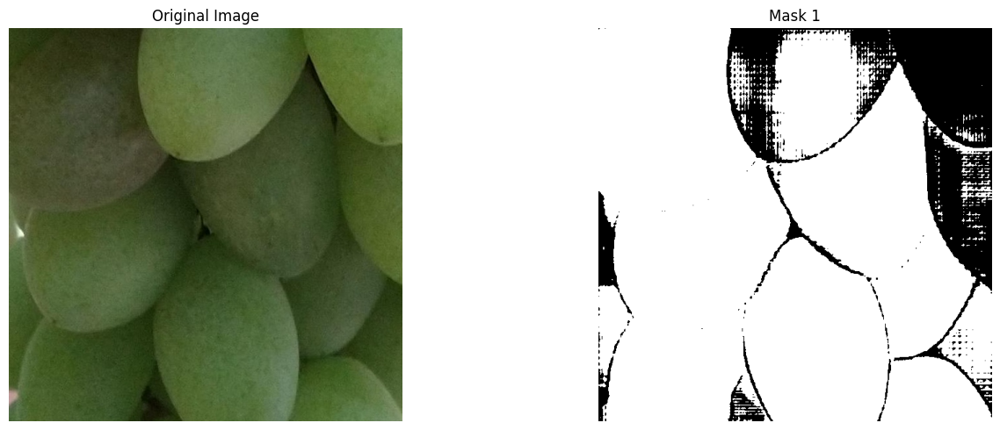

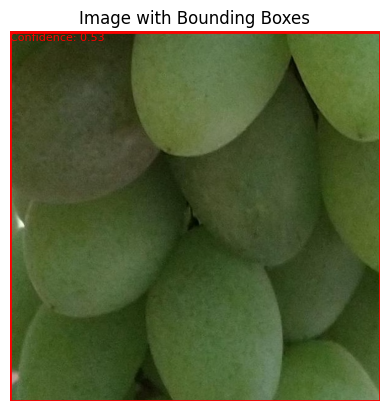

Bounding Boxes:
Box 1: tensor([-3.5405e-03,  7.0810e-03,  6.0000e+02,  6.0001e+02])

Detected Phrases:
Phrase 1: sick

Confidence:
Logit 1: 0.5320708155632019
------------------------------------------------------------

final text_encoder_type: bert-base-uncased
Model loaded from /root/.cache/huggingface/hub/models--ShilongLiu--GroundingDINO/snapshots/a94c9b567a2a374598f05c584e96798a170c56fb/groundingdino_swinb_cogcoor.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])


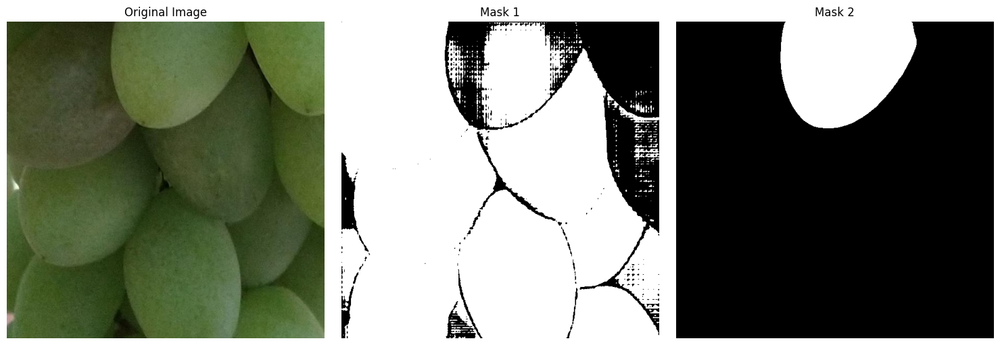

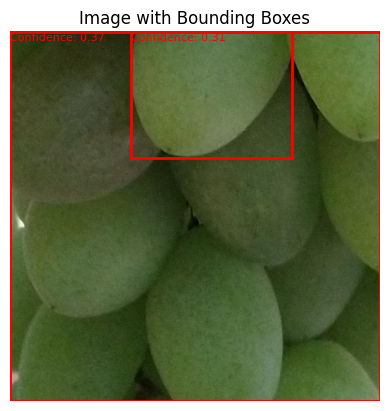

Bounding Boxes:
Box 1: tensor([1.9813e-02, 6.6233e-02, 6.0002e+02, 6.0006e+02])
Box 2: tensor([1.9517e+02, 1.1548e-01, 4.5654e+02, 2.0521e+02])

Detected Phrases:
Phrase 1: moldy
Phrase 2: moldy

Confidence:
Logit 1: 0.37174534797668457
Logit 2: 0.30869272351264954
------------------------------------------------------------

final text_encoder_type: bert-base-uncased
Model loaded from /root/.cache/huggingface/hub/models--ShilongLiu--GroundingDINO/snapshots/a94c9b567a2a374598f05c584e96798a170c56fb/groundingdino_swinb_cogcoor.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])


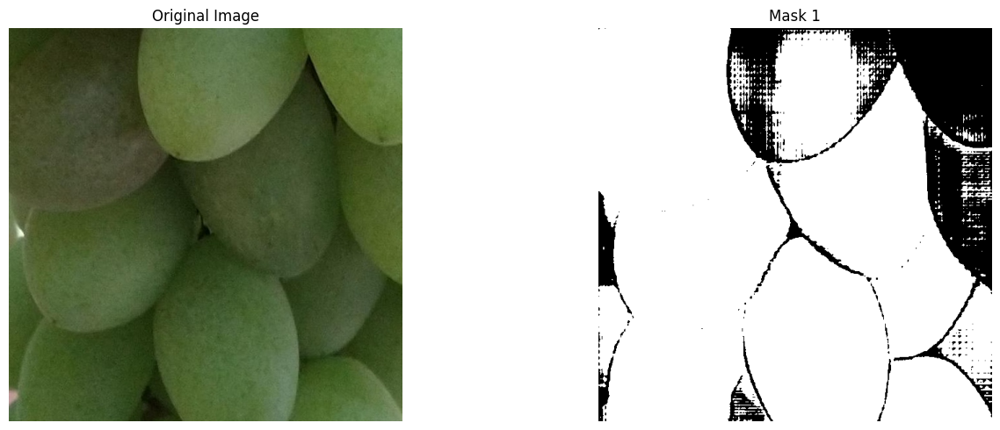

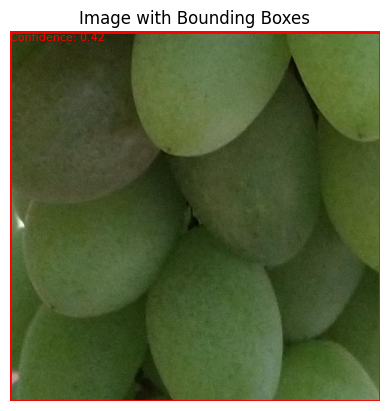

Bounding Boxes:
Box 1: tensor([1.8632e-02, 6.6411e-02, 6.0002e+02, 6.0006e+02])

Detected Phrases:
Phrase 1: rancid

Confidence:
Logit 1: 0.4156014323234558
------------------------------------------------------------

final text_encoder_type: bert-base-uncased
Model loaded from /root/.cache/huggingface/hub/models--ShilongLiu--GroundingDINO/snapshots/a94c9b567a2a374598f05c584e96798a170c56fb/groundingdino_swinb_cogcoor.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])


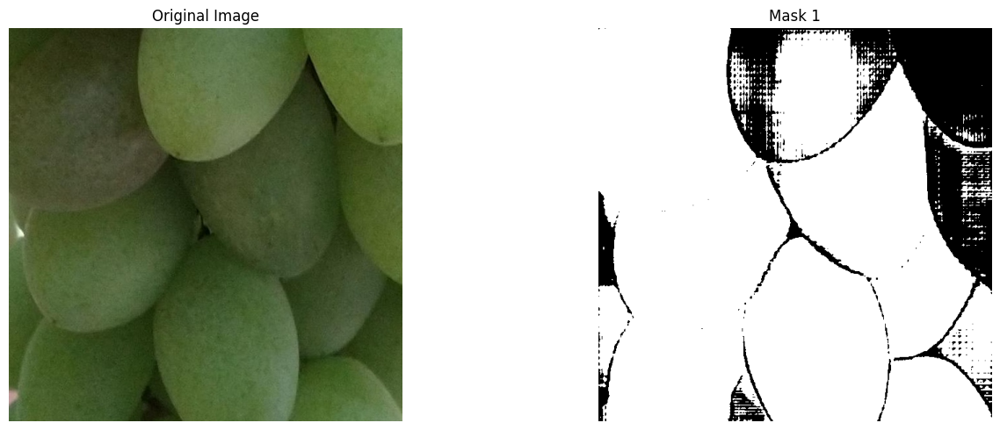

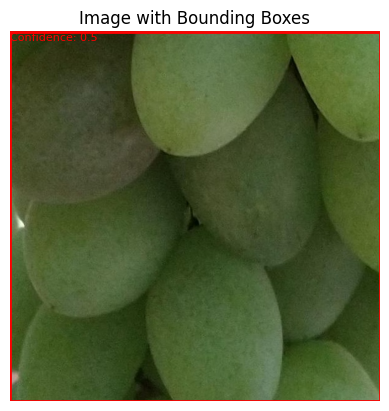

Bounding Boxes:
Box 1: tensor([1.4234e-02, 4.3738e-02, 6.0001e+02, 6.0004e+02])

Detected Phrases:
Phrase 1: putrid

Confidence:
Logit 1: 0.4952641725540161
------------------------------------------------------------

final text_encoder_type: bert-base-uncased
Model loaded from /root/.cache/huggingface/hub/models--ShilongLiu--GroundingDINO/snapshots/a94c9b567a2a374598f05c584e96798a170c56fb/groundingdino_swinb_cogcoor.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])


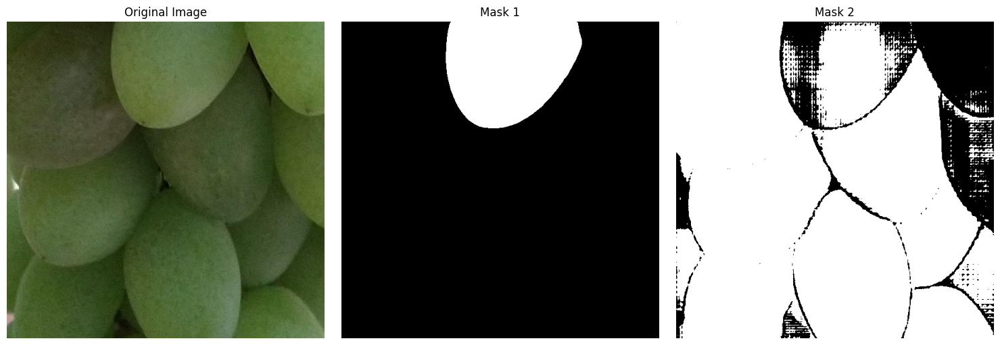

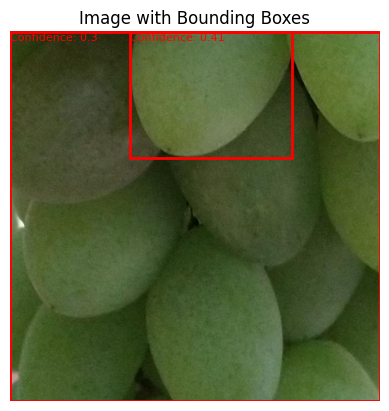

Bounding Boxes:
Box 1: tensor([1.9482e+02, 1.3196e-01, 4.5675e+02, 2.0573e+02])
Box 2: tensor([-4.2701e-02, -4.4882e-02,  5.9996e+02,  5.9995e+02])

Detected Phrases:
Phrase 1: bad
Phrase 2: bad

Confidence:
Logit 1: 0.40814054012298584
Logit 2: 0.30346545577049255
------------------------------------------------------------

final text_encoder_type: bert-base-uncased
Model loaded from /root/.cache/huggingface/hub/models--ShilongLiu--GroundingDINO/snapshots/a94c9b567a2a374598f05c584e96798a170c56fb/groundingdino_swinb_cogcoor.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight', 'bert.embeddings.position_ids'])


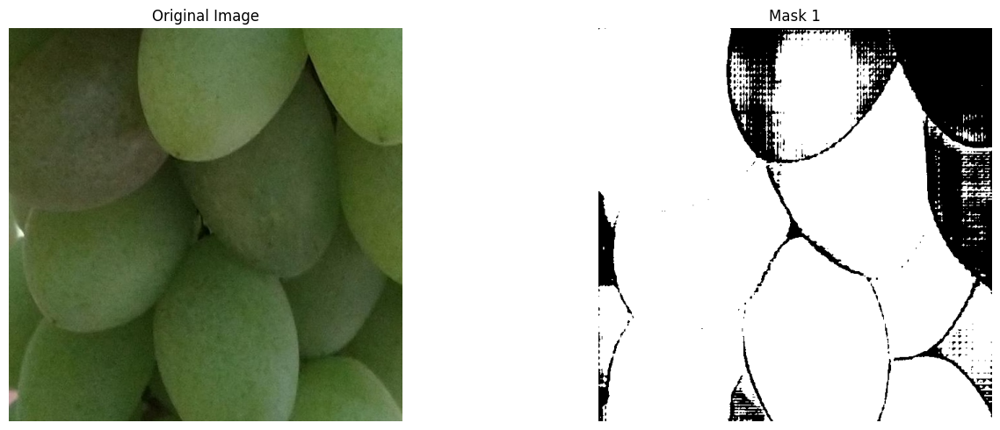

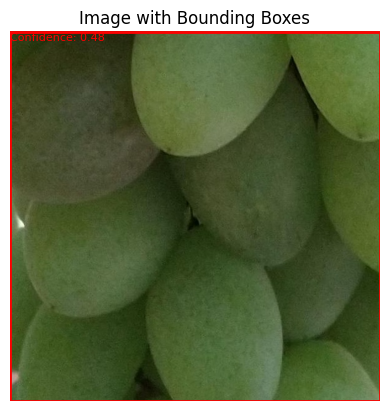

Bounding Boxes:
Box 1: tensor([-7.2956e-03,  6.5947e-02,  5.9999e+02,  6.0006e+02])

Detected Phrases:
Phrase 1: decomposed

Confidence:
Logit 1: 0.47622033953666687
------------------------------------------------------------



In [64]:
import warnings
import numpy as np
import matplotlib.pyplot as plt
import requests
from PIL import Image
from io import BytesIO
from lang_sam import LangSAM

image = "/content/IMG_20210924_122457774_0_01.jpg"
# image = "./image.jpg"
prompts=["rotten", "sick","moldy","rancid","putrid","bad","decomposed"]

for i in range(len(prompts)):
  text_prompt = prompts[i]

      # Suppress warning messages
  warnings.filterwarnings("ignore")

  try:
      if image.startswith("http"):
          image_pil = download_image(image)
      else:
          image_pil = Image.open(image).convert("RGB")

      model = LangSAM()
      masks, boxes, phrases, logits = model.predict(image_pil, text_prompt)

      if len(masks) == 0:
          print(f"No objects of the '{text_prompt}' prompt detected in the image.")
      else:
          # Convert masks to numpy arrays
          masks_np = [mask.squeeze().cpu().numpy() for mask in masks]

          # Display the original image and masks side by side
          display_image_with_masks(image_pil, masks_np)

          # Display the image with bounding boxes and confidence scores
          display_image_with_boxes(image_pil, boxes, logits)

          # Save the masks
          for i, mask_np in enumerate(masks_np):
              mask_path = f"image_mask_{i+1}.png"
              save_mask(mask_np, mask_path)

          # Print the bounding boxes, phrases, and logits
          print_bounding_boxes(boxes)
          print_detected_phrases(phrases)
          print_logits(logits)
          print("------------------------------------------------------------\n")
  except (requests.exceptions.RequestException, IOError) as e:
      print(f"Error: {e}")



#Data Processing

##importing datas from drive

In [ ]:
import os
import torch
from PIL import Image
from google.colab import drive
import matplotlib.pyplot as plt

drive.mount('/content/drive',force_remount=True)
DATA_DIR = os.path.join("drive", "MyDrive", "Canopies-data")